# Tree sway video analysis for a stand of trees at the Manitou Experimental Forest, CO

**Author: Joe Ammatelli, jamma@uw.edu, University of Washington, 2023**

**Overview**

This notebook facilitates the extraction and validation of tree sway frequency data from a video.
The notebook was specifically implemmented for evaluating video and accelerometer data for two trees at the Manitou Experimental Forest in Colorado.

Here, for both trees, we extract sway frequency data from a video using an adapted video processing algorithm, the Virtual Vision Sensor algorithm from Schumacher and Shariati (2013), and compare the results to sway frequencies extracted from 2 lengths of accelerometer data.

The notebook is divided into 5 parts:
1. Initialize processing parameters
2. Extract sway frequencies from tree 1 using both video and accelerometer data
3. Extract sway frequencies from tree 2 using both video and accelerometer data
4. Plot video and accelerometer data together (for publication quality plot)
5. Generate another figure that has a frequency heat map for a region spanning tree 1 and tree 2

The workflow has been designed so that users configure essential processing parameters in step 1 and then simply step through the remaining cells.

Part 5 includes code used to generate a publication quality figure for both trees (and region 1 when RAM allows).

**Description of Video Processing Pipeline**

The logic for both video processing algorithms has been abstracted into a modular workflow with 4 abstract steps:
1. Translating a video to vibration signals (vid2vib_utils.py)
2. Estimating the power spectral density (PSD) of each vibration signal (spectra_utils.py)
3. Aggregating frequency content across all vibration signals (aggregate_utils.py)
4. Reporting the output peak frequency (plotting_utils.py)

Functions related to each abstract step are implemented in the util python files in parentheses above.

Each video processing algorithm then has an Analyzer object that combines functions from the util files to create an end-to-end algorithm. Each Analyzer object has one function corresponding to each abstract step. These functions serve as wrappers and enable users users to customize key elements of the video processing pipeline without modifying the pipeline itself. For key computation steps, users can invoke existing functions or define their own. For example, for step 2, users can choose from existing methods for estimating the power spectral density (see spectra_utils.py) or define their own.

Once processing parameters have been configured, the user can simiply call each step of the analyer object to process the video.

**Sources**

Ferrer, B., Espinosa, J., Roig, A. B., Perez, J., & Mas, D. (2013). Vibration frequency 
    measurement using a local multithreshold technique. Optics Express, 21(22), 26198–26208. 
    https://doi.org/10.1364/OE.21.026198

Schumacher, T., & Shariati, A. (2013). Monitoring of Structures and Mechanical Systems Using 
    Virtual Visual Sensors for Video Analysis: Fundamental Concept and Proof of Feasibility. 
    Sensors, 13(12), Article 12. https://doi.org/10.3390/s131216551

In [1]:
import numpy as np
import numpy.ma as ma
import pandas as pd
import cv2
import matplotlib
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.patches as patches
from matplotlib.lines import Line2D
import datetime
import scipy

import VVSAnalyzer
import MBTAnalyzer
import vid2vib_utils
import spectra_utils
import aggregate_utils
import plotting_utils
import accelerometer_utils

## 1. Initialize processing parameters

### 1.1 Choose video data (accelerometer data selected below)

In [2]:
# Video samples and corresondting time-stamp
vid_datetimes = {'manitou-a' : '2020-8-15 12:05:58',
                 'manitou-b' : '2020-8-20 17:28:9',
                 'manitou-c' : '2020-8-31 11:50:20'}

# name of video sample to process
vid_name = 'manitou-b'

# path to video sample
vid_path = f'../../../../Desktop/Manitou/{vid_name}.MP4'

#### 1.1.1 Verift the video datetime

In [3]:
vid2vib_utils.get_video_datetime(vid_path)

datetime.datetime(2020, 8, 20, 17, 28, 9)

### 1.2 Define regions of interests (ROIs)

In [4]:
# regions of interest
rois = {'tree1' : [440, 520, 395, 425],
        'tree2' : [400, 575, 690, 760],
        'region1' : [336, 732, 200, 904]}

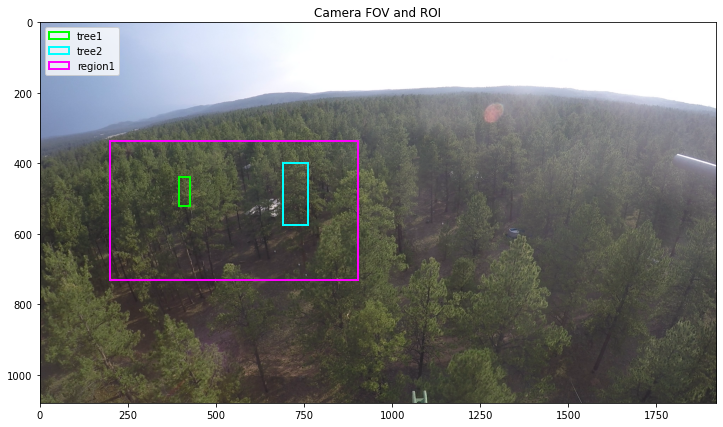

In [5]:
ax = plotting_utils.plot_frame(vid_path, title='Camera FOV and ROI', figsize=(14,7))
plotting_utils.plot_rois(ax, rois.values(), roicolors=['lime', 'cyan', 'fuchsia'])
ax.legend(rois.keys(), loc='upper left')

### 1.3 Specify a location to store the processing context, output data, and figures

In [6]:
out_prefix = f'./output/{vid_name}/'

### 1.4 Define video processing parameters for individual trees

The video processing pipeline, regardless of algorithm type, is divided into 4 main steps:
1. Translating a video to vibration signals
2. Estimating the power spectral density (PSD) of each vibration signal
3. Aggregating frequency content across all vibration signals
4. Reporting the output peak frequency

The parameters for each step are configured below. For a description of functions their arguments see:
* vid2vib_utils.py
* spectra_utils.py
* aggregate_utils.py
* plotting_utils.py
* accelerometer_utils.py

#### 1.4.1 Parameters for video to vibration translation

In [7]:
# keyword arguments for VVS video to vibration translation (which uses vid2vib.uncompressed_vid)
vid2vib_vvs_kwargs = {'reduction':'gray'}

# keyword argumetns for MBT video to vibration translation (which uses vid2vib.mbt)
vid2vib_mbt_kwargs = {'reduction':'gray'}

# number of MBT signals to generate
nlevels = 8

#### 1.4.2 Parameters for estimating the power spectral density (PSD) of each signal

In [8]:
# lower bound of canidate frequencies
freqmin = 0.15

# upper bound of candidate frequencies
freqmax = 0.5

# function used to estimate PSD of vibration signals
spectra_func = spectra_utils.get_spectra_periodogram

# kwargs for spectra_func
spectra_func_kwargs = {'window':'hann', 
                       'nfft':None}

#### 1.4.3  Parameters for aggregating the frequency content across all vibration spectra

In [9]:
# function used to aggregate vibration PSDs
dom_freq_func = spectra_utils.get_dom_freq_peak_finder

# kwargs for aggregating function
dom_freq_func_kwargs = {}

# masks applied to vibration signals
percentile=75  # percentile of peak prominences below which signals are masked

# mask type
masks = [{'name':f'Prominence, {percentile}th percentile',
          'weight':'prominence',
          'kwargs':{'stat_reduc':'percentile', 'percentile':percentile}}, 
        ]

#### 1.4.4 Parameters for reporting the output

In [10]:
figsize=(14,7)

### 1.5 Define accelerometer processing parameters

In [11]:
# accelerometer sampling frequency in Hz
acc_fs = 16 

# processing parameters for short accelerometer segment
short_segment_length = 0.5 # minutes
acc_short_spectra_func_kwargs = spectra_func_kwargs


# processing parameters for long segment
long_segment_length = 30 # minutes
# kwargs defined below since depend on video output

## 2. Tree 1 sway frequency

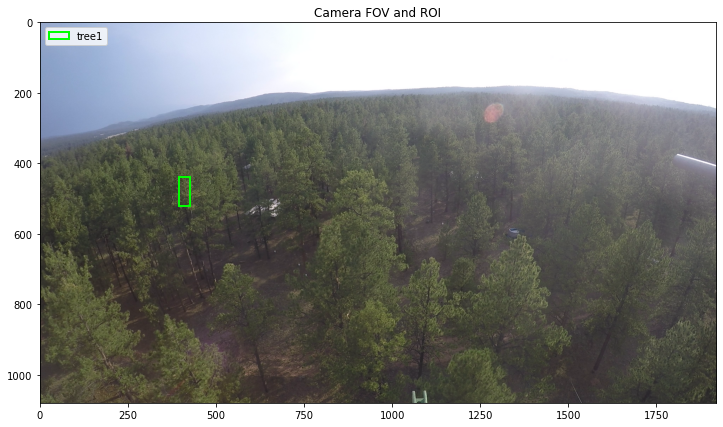

In [12]:
roi = 'tree1'

ax = plotting_utils.plot_frame(vid_path, title='Camera FOV and ROI', figsize=(14,7))
plotting_utils.plot_rois(ax, [rois[roi]], roicolors=['lime'])
ax.legend([roi], loc='upper left')

### 2.1 Extract sway frequencies using the 'Virtual Vision Sensor' (VVS) algorithm

#### 2.1.1 Create a VVSAnalyer object

The VVSAnalyzer object provides a convenient and compact way to execute each step of the processing pipeline.

In [13]:
vvs_t1 = VVSAnalyzer.VVSAnalyzer(vid_path, rois[roi], out_prefix)

#### 2.1.2 Translate the video data into vibration signals using the VVS translation

In [14]:
vib_vvs_t1, fps = vvs_t1.vid2vib(vid2vib_vvs_kwargs)

Reading video into array
902
Finished reading video into array


##### 2.1.2.1 Verify fps is as expected

In [15]:
fps

29.97002997002997

#### 2.1.3 Estimate the power spectral density (PSD) for each vibration signal 

In [16]:
freq_vvs_t1, pxx_vvs_t1 = vvs_t1.compute_spectra(freqmin, freqmax, spectra_func, spectra_func_kwargs)

Computing pixel spectra
Finished computing spectra


#### 2.1.4 Aggregate the frequency content across all vibration spectra

In [17]:
agg_df_vvs_t1, pxx_avg_vvs_t1, pxx_avg_peak_idx_vvs_t1, dom_freq_t1, masked_t1, masked_avg_spectrums_t1, masked_avg_spectrums_peak_idxs_t1 = vvs_t1.aggregate(dom_freq_func, dom_freq_func_kwargs, masks)
pixel_counts_t1, bins_t1 = aggregate_utils.hist_spectrum(masked_t1[0], freq_vvs_t1)
hist_peak_idx_t1, _, _ = spectra_utils.find_dominant_peak(pixel_counts_t1, criteria='magnitude')

#### 2.1.5 Plot Output

,unmasked_avg_spectrum_peak,unmasked_mode,mask0_avg_spectrum_peak,mask0_mode
0,0.299993,0.30731,0.299993,0.296335


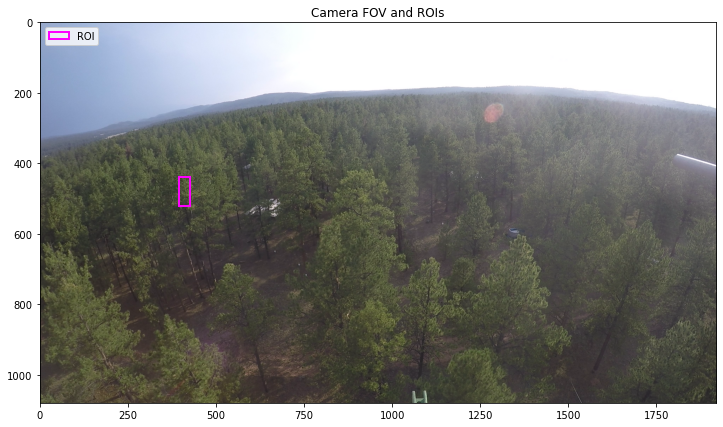

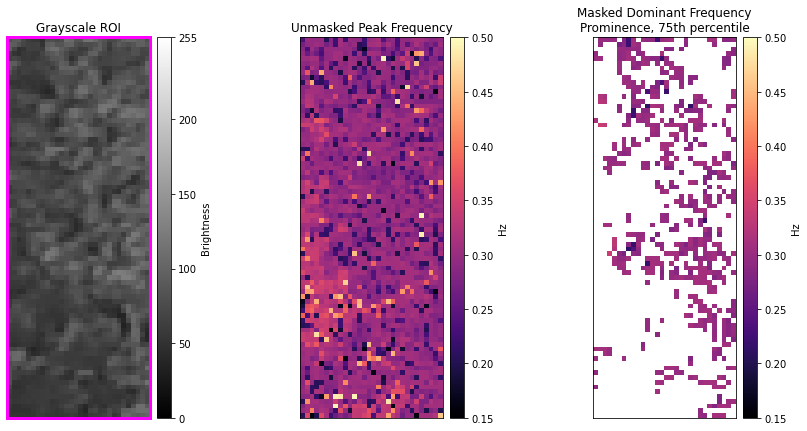

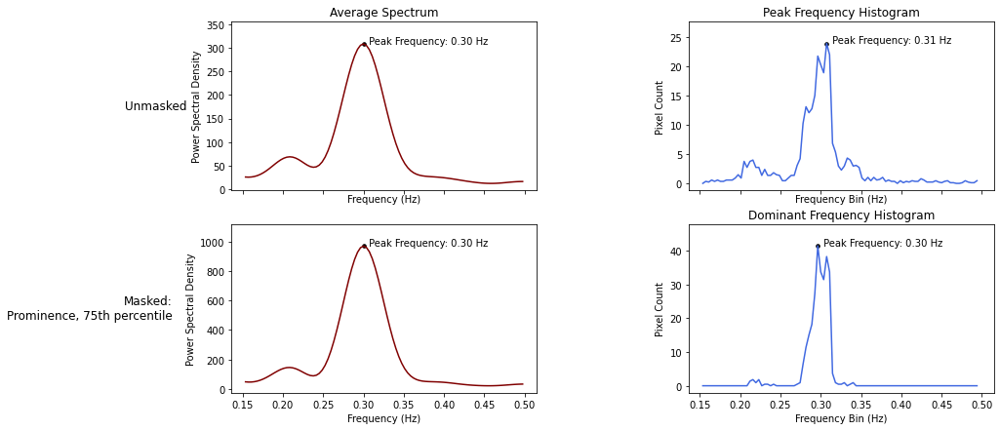

In [18]:
vvs_t1.report(figsize=figsize)

### 2.2 Extract sway frequencies from accelerometer data

#### 2.2.1 Load the accelerometer data

In [19]:
# accel path
acc_path_t1 = f'../../../../Desktop/Manitou/manitou_accelerometer_{vid_name[-1]}_tree1.csv'

acc_t1_df = pd.read_csv(acc_path_t1, 
                        index_col=0,
                        parse_dates=True,
                        infer_datetime_format=True)

#### 2.2.2 Extract sway frequency from an accelerometer segment with the same start time, duration, and processing parameters as the video

In [20]:
df_acc_short_t1, freq_acc_short_t1, pxx_acc_short_t1, pxx_avg_acc_short_t1, pxx_avg_peak_idx_acc_short_t1 = accelerometer_utils.get_accel_spectra(acc_t1_df, 
                                                                                                                                                   fs=acc_fs,
                                                                                                                                                   t0=vid_datetimes[vid_name],
                                                                                                                                                   date_format='%Y-%m-%d %H:%M:%S',
                                                                                                                                                   freqmin=freqmin, 
                                                                                                                                                   freqmax=freqmax, 
                                                                                                                                                   length=short_segment_length,
                                                                                                                                                   center=False,
                                                                                                                                                   spectra_func=spectra_utils.get_spectra_periodogram,
                                                                                                                                                   spectra_func_kwargs=spectra_func_kwargs)

Computing pixel spectra
Finished computing spectra


#### 2.2.3 Extract sway frequency from a 30-minute accelerometer segment using Welch's method

In [21]:
acc_30_spectra_func_kwargs = {'window':'hann', 
                              'nperseg':4800, 
                              'nfft': 8 * spectra_utils.get_next_pow2(vib_vvs_t1.shape[0])}

df_acc30_t1, freq_acc30_t1, pxx_acc30_t1, pxx_avg_acc30_t1, pxx_avg_peak_idx_acc30_t1 = accelerometer_utils.get_accel_spectra(acc_t1_df, 
                                                                                                                               fs=acc_fs,
                                                                                                                               t0=vid_datetimes[vid_name],
                                                                                                                               date_format='%Y-%m-%d %H:%M:%S',
                                                                                                                               freqmin=freqmin, 
                                                                                                                               freqmax=freqmax, 
                                                                                                                               length=long_segment_length,
                                                                                                                               spectra_func=spectra_utils.get_spectra_welch,
                                                                                                                               spectra_func_kwargs=acc_30_spectra_func_kwargs,
                                                                                                                               center=True)

Computing pixel spectra
Finished computing spectra


## 3. Tree 2 sway frequency

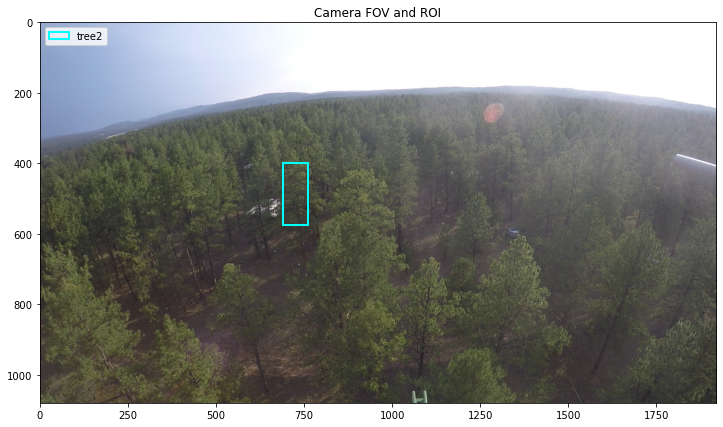

In [22]:
roi = 'tree2'

ax = plotting_utils.plot_frame(vid_path, title='Camera FOV and ROI', figsize=(14,7))
plotting_utils.plot_rois(ax, [rois[roi]], roicolors=['cyan'])
ax.legend([roi], loc='upper left')

### 3.1 Extract sway frequencies using the 'Virtual Vision Sensor' (VVS) algorithm

#### 3.1.1 Create a VVSAnalyer object

The VVSAnalyzer object provides a convenient and compact way to execute each step of the processing pipeline.

In [23]:
vvs_t2 = VVSAnalyzer.VVSAnalyzer(vid_path, rois[roi], out_prefix)

#### 3.1.2 Translate the video data into vibration signals using the VVS translation

In [24]:
vib_vvs_t2, fps = vvs_t2.vid2vib(vid2vib_vvs_kwargs)

Reading video into array
902
Finished reading video into array


##### 3.1.2.1 Verify fps is as expected

In [25]:
fps

29.97002997002997

#### 3.1.3 Estimate the power spectral density (PSD) for each vibration signal 

In [26]:
freq_vvs_t2, pxx_vvs_t2 = vvs_t2.compute_spectra(freqmin, freqmax, spectra_func, spectra_func_kwargs)

Computing pixel spectra
Finished computing spectra


#### 3.1.4 Aggregate the frequency content across all vibration spectra

In [27]:
agg_df_vvs_t2, pxx_avg_vvs_t2, pxx_avg_peak_idx_vvs_t2, dom_freq_t2, masked_t2, masked_avg_spectrums_t2, masked_avg_spectrums_peak_idxs_t2 = vvs_t2.aggregate(dom_freq_func, dom_freq_func_kwargs, masks)
pixel_counts_t2, bins_t2 = aggregate_utils.hist_spectrum(masked_t2[0], freq_vvs_t2)
hist_peak_idx_t2, _, _ = spectra_utils.find_dominant_peak(pixel_counts_t2, criteria='magnitude')

#### 3.1.5 Plot Output

,unmasked_avg_spectrum_peak,unmasked_mode,mask0_avg_spectrum_peak,mask0_mode
0,0.365845,0.365845,0.365845,0.365845


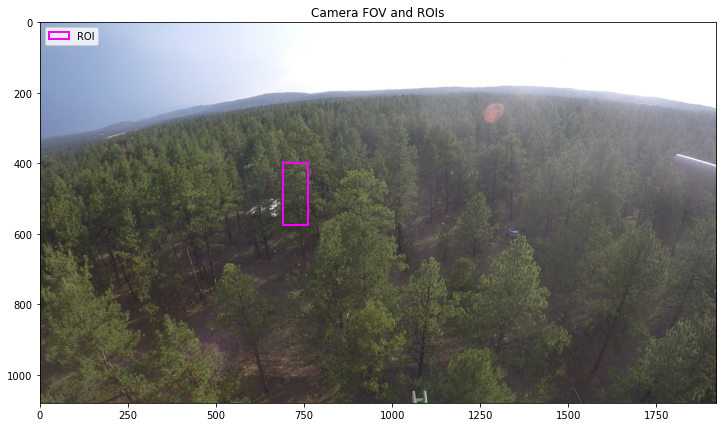

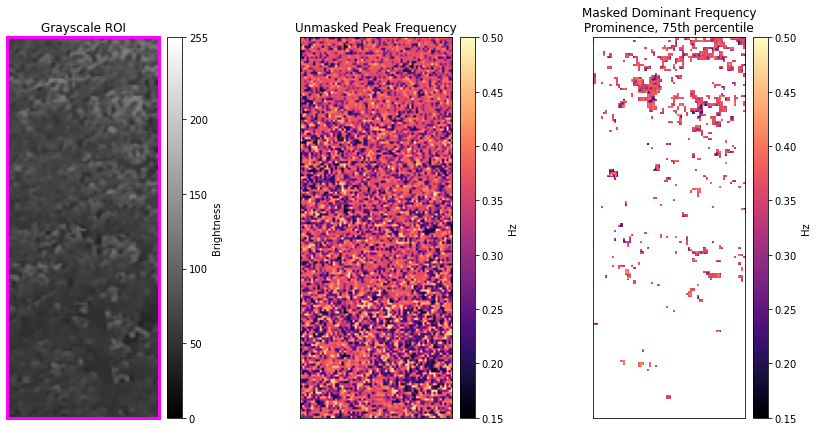

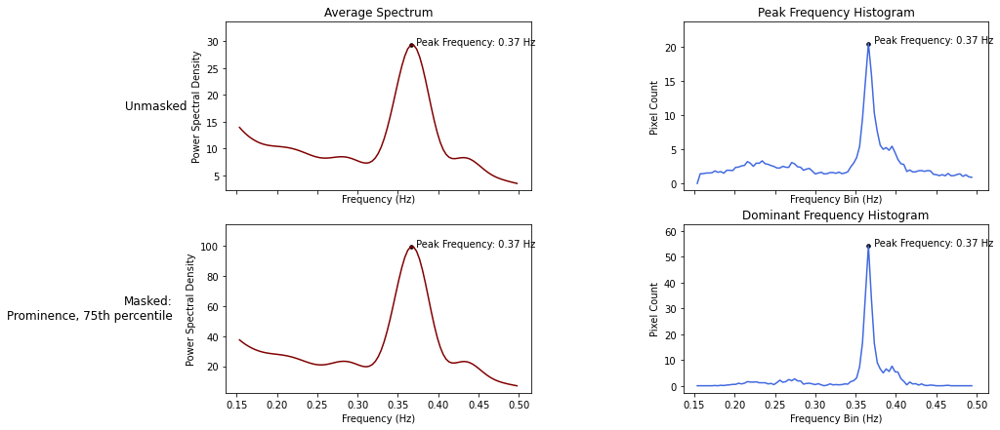

In [28]:
vvs_t2.report(figsize=figsize)

### 3.2 Extract sway frequencies from accelerometer data

#### 3.2.1 Load the accelerometer data

In [29]:
# accel path
acc_path_t2 = f'../../../../Desktop/Manitou/manitou_accelerometer_{vid_name[-1]}_tree2.csv'

acc_t2_df = pd.read_csv(acc_path_t2, 
                        index_col=0,
                        parse_dates=True,
                        infer_datetime_format=True)

#### 3.2.2 Extract sway frequency from an accelerometer segment with the same start time, duration, and processing parameters as the video

In [30]:
df_acc_short_t2, freq_acc_short_t2, pxx_acc_short_t2, pxx_avg_acc_short_t2, pxx_avg_peak_idx_acc_short_t2 = accelerometer_utils.get_accel_spectra(acc_t2_df, 
                                                                                                                                                   fs=acc_fs,
                                                                                                                                                   t0=vid_datetimes[vid_name],
                                                                                                                                                   date_format='%Y-%m-%d %H:%M:%S',
                                                                                                                                                   freqmin=freqmin, 
                                                                                                                                                   freqmax=freqmax, 
                                                                                                                                                   length=short_segment_length,
                                                                                                                                                   center=False,
                                                                                                                                                   spectra_func=spectra_utils.get_spectra_periodogram,
                                                                                                                                                   spectra_func_kwargs=spectra_func_kwargs)

Computing pixel spectra
Finished computing spectra


#### 3.2.3 Extract sway frequency from a 30-minute accelerometer segment using Welch's method

In [31]:
acc_30_spectra_func_kwargs = {'window':'hann', 
                              'nperseg':4800, 
                              'nfft': 8 * spectra_utils.get_next_pow2(vib_vvs_t1.shape[0])}

df_acc30_t2, freq_acc30_t2, pxx_acc30_t2, pxx_avg_acc30_t2, pxx_avg_peak_idx_acc30_t2 = accelerometer_utils.get_accel_spectra(acc_t2_df, 
                                                                                                                               fs=acc_fs,
                                                                                                                               t0=vid_datetimes[vid_name],
                                                                                                                               date_format='%Y-%m-%d %H:%M:%S',
                                                                                                                               freqmin=freqmin, 
                                                                                                                               freqmax=freqmax, 
                                                                                                                               length=long_segment_length,
                                                                                                                               spectra_func=spectra_utils.get_spectra_welch,
                                                                                                                               spectra_func_kwargs=acc_30_spectra_func_kwargs,
                                                                                                                               center=True)

Computing pixel spectra
Finished computing spectra


## 4. Plot video and accelerometer data together (for publication quality plot)

**Note: The following plot has been designed specifically for the manitou-b sample. Minor adjustments will likely be needed for other video samples. In particular, all annotations and the signal label parameters (offset parameters) will need to be adjusted.**

### 4.1 Define output signals

#### 4.1.1 Compute possible frequency resolutions

In [32]:
vid_len = vib_vvs_t1.shape[0]  # frames
freq_vid = scipy.fft.rfftfreq(vid_len, 1 / fps)
df_vid = freq_vid[1] - freq_vid[0]

acc_short_len = len(df_acc_short_t1['Ax']) # samples
freq_short = scipy.fft.rfftfreq(acc_short_len, 1 / acc_fs)
df_short = freq_short[1] - freq_short[0]

acc_long_len = len(df_acc30_t1['Ax']) # samples
freq_30 = scipy.fft.rfftfreq(acc_long_len, 1 / acc_fs)
df_30 = freq_30[1] - freq_30[0]

#### 4.1.2 Define signals and plotting parameters for tree 1

In [33]:
acc_30_t1 = {'freq' : freq_acc30_t1,
             'frequency_resolution' : df_30,
             'psd' : pxx_avg_acc30_t1, 
             'peak_idx' : pxx_avg_peak_idx_acc30_t1, 
             'label' : 'Accelerometer, 30-min segment', 
             'color' : '#88CCEE', 
             'label_color' : '#88CCEE'}

acc_short_t1 = {'freq' : freq_acc_short_t1,
                'frequency_resolution' : df_short,
                'psd' : pxx_avg_acc_short_t1, 
                'peak_idx' : pxx_avg_peak_idx_acc_short_t1, 
                'label' : 'Accelerometer, 60-sec segment', 
                'color' : '#117733', 
                'label_color' : '#117733'}

vvs_hist_t1 = {'freq' : bins_t1, 
               'frequency_resolution' : df_vid,
               'psd' : pixel_counts_t1, 
               'peak_idx' : hist_peak_idx_t1, 
               'label' : 'VVS, peak frequency count', 
               'color' : '#AA4499', 
               'label_color' : '#AA4499'}

vvs_avg_t1 = {'freq' : freq_vvs_t1,
              'frequency_resolution' : df_vid,
              'psd' : masked_avg_spectrums_t1[0], 
              'peak_idx' : pxx_avg_peak_idx_vvs_t1, 
              'label' : 'VVS, average spectrum', 
              'color' : '#CC6677', 
              'label_color' : '#CC6677'}

#### 4.1.3 Define signals and plotting parameters for tree 2

In [34]:
acc_30_t2 = {'freq' : freq_acc30_t2,
             'frequency_resolution' : df_30,
              'psd' : pxx_avg_acc30_t2, 
              'peak_idx' : pxx_avg_peak_idx_acc30_t2, 
              'label' : 'Accelerometer, 30-min segment', 
              'color' : '#88CCEE', 
              'label_color' : '#88CCEE'}

acc_short_t2 = {'freq' : freq_acc_short_t2,
                'frequency_resolution' : df_short,
                'psd' : pxx_avg_acc_short_t2, 
                'peak_idx' : pxx_avg_peak_idx_acc_short_t2, 
                'label' : 'Accelerometer, 60-sec segment', 
                'color' : '#117733', 
                'label_color' : '#117733'}

vvs_hist_t2 = {'freq' : bins_t2, 
               'frequency_resolution' : df_vid,
               'psd' : pixel_counts_t2, 
               'peak_idx' : hist_peak_idx_t2, 
               'label' : 'VVS, peak frequency count', 
               'color' : '#AA4499', 
               'label_color' : '#AA4499'}

vvs_avg_t2 = {'freq' : freq_vvs_t2,
              'frequency_resolution' : df_vid,
              'psd' : masked_avg_spectrums_t2[0], 
              'peak_idx' : pxx_avg_peak_idx_vvs_t2, 
              'label' : 'VVS, average spectrum', 
              'color' : '#CC6677', 
              'label_color' : '#CC6677'}

#### 4.1.4 Choose output signals to plot

In [35]:
output_signals_t1 = [acc_30_t1, acc_short_t1, vvs_hist_t1, vvs_avg_t1]
output_signals_t2 = [acc_30_t2, acc_short_t2, vvs_hist_t2, vvs_avg_t2]

In [36]:
print('**Tree 1 output frequencies**')
for i, s in enumerate(output_signals_t1):
    label = s['label']
    peak = s['freq'][s['peak_idx']]
    print(f'{label} : {peak}')

**Tree 1 output frequencies**
Accelerometer, 30-min segment : 0.294921875
Accelerometer, 60-sec segment : 0.265625
VVS, peak frequency count : 0.2963345248501498
VVS, average spectrum : 0.29999297577422573


In [37]:
print('**Tree 2 output frequencies**')
for i, s in enumerate(output_signals_t2):
    label = s['label']
    peak = s['freq'][s['peak_idx']]
    print(f'{label} : {peak}')

**Tree 2 output frequencies**
Accelerometer, 30-min segment : 0.376953125
Accelerometer, 60-sec segment : 0.38671875
VVS, peak frequency count : 0.36584509240759233
VVS, average spectrum : 0.36584509240759233


### 4.2 Plot output spectra and peaks for both trees
Parameters set for manitouo-B sample.

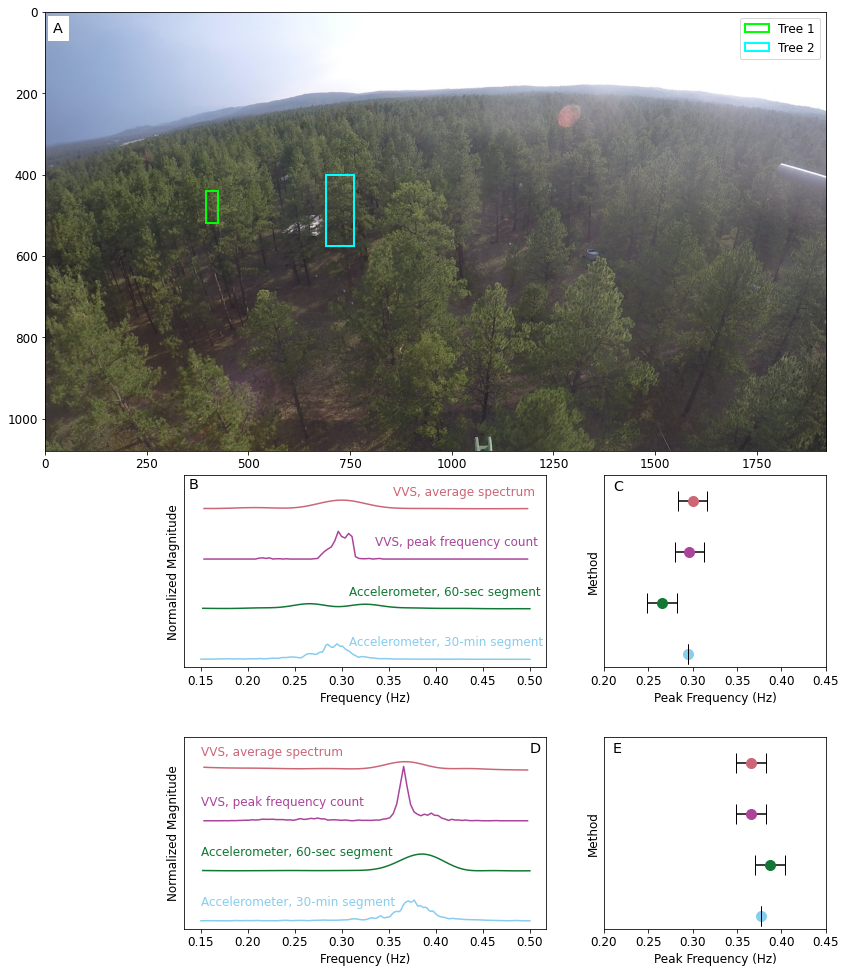

In [38]:
import matplotlib
matplotlib.rcParams.update({'font.size': 12})

pattern = '''
AAAAAA
AAAAAA
AAAAAA
AAAAAA
AAAAAA
AAAAAA
AAAAAA
AAAAAA
AAAAAA
.BBBCC
.BBBCC
.BBBCC
.BBBCC
......
.DDDEE
.DDDEE
.DDDEE
.DDDEE
'''

# uncomment dpi for higher resolution figure
fig, ax = plt.subplot_mosaic(pattern, figsize=(14,17))#, dpi=500)

# Plot frame and ROI
plotting_utils.plot_frame(vid_path, ax=ax['A'])
plotting_utils.plot_rois(ax['A'], [rois['tree1'], rois['tree2']], roicolors=['lime', 'cyan'])
ax['A'].annotate('A', (20,50), c='k', backgroundcolor='w', fontsize='large')
ax['A'].legend(['Tree 1', 'Tree 2'])

#*** Tree 1 ***

# Plot offset spectra for tree 1
bottom = 0 # where first signal starts
pad = 75 # space between each signal
label_hoffsets = [0.3075, 0.3075, 0.335, 0.355] # horizontal offsets of signal labels
label_voffset = 20 # vertical  offset of signal label
for i, s in enumerate(output_signals_t1):
    f = s['freq']
    df = f[1] - f[0]
    
    psd_normalized = spectra_utils.normalize(s['psd'], dx=df)
    
    ax['B'].plot(f, psd_normalized + bottom,label=s['label'], c=s['color'])
    ax['B'].annotate(s['label'], 
                     (label_hoffsets[i],bottom + label_voffset), 
                     c=s['label_color'], 
                     backgroundcolor='None', 
                     fontsize='medium')
    bottom = bottom + pad
ylim = ax['B'].get_ylim()
ax['B'].set_ylim(ylim[0], 1.1*ylim[1])  
ax['B'].set_ylabel('Normalized Magnitude')
ax['B'].set_xlabel('Frequency (Hz)')
ax['B'].set_yticks([])
ax['B'].annotate('B', (0.1375,255), c='k', backgroundcolor='None', fontsize='large')

# Plot corresponding peaks
for i, s in enumerate(output_signals_t1):
    peak = s['freq'][s['peak_idx']]
    ax['C'].errorbar(peak, i, xerr=s['frequency_resolution'] / 2, color='k', capsize=10)
    ax['C'].scatter(peak, i, color=s['color'], marker='.', s=400, zorder=2)
ax['C'].set_xlim(0.2, 0.45)
ax['C'].set_yticks([])
ax['C'].set_xlabel('Peak Frequency (Hz)')
ax['C'].set_ylabel('Method')
ax['C'].set_ylim(-0.25, 3.5)
ax['C'].annotate('C', (0.21,3.2), c='k', backgroundcolor='None', fontsize='large')

#*** Tree 2 ***

# Plot offset spectra for tree 2
bottom = 0 
pad = 50
label_hoffset = 0.15
label_voffset = 15
for s in output_signals_t2:
    f = s['freq']
    df = f[1] - f[0]
    
    psd_normalized = spectra_utils.normalize(s['psd'], dx=df)
    
    ax['D'].plot(f, psd_normalized + bottom,label=s['label'], c=s['color'])
    ax['D'].annotate(s['label'], 
                     (label_hoffset,bottom + label_voffset), 
                     c=s['label_color'], 
                     backgroundcolor='None', 
                     fontsize='medium')
    bottom = bottom + pad
ylim = ax['D'].get_ylim()
ax['D'].set_ylim(ylim[0], 1.1*ylim[1])  
ax['D'].set_ylabel('Normalized Magnitude')
ax['D'].set_xlabel('Frequency (Hz)')
ax['D'].set_yticks([])
ax['D'].annotate('D', (0.50,168), c='k', backgroundcolor='None', fontsize='large')

# Plot corresponding peaks
for i, s in enumerate(output_signals_t2):
    peak = s['freq'][s['peak_idx']]
    ax['E'].errorbar(peak, i, xerr=s['frequency_resolution'] / 2, color='k', capsize=10)
    ax['E'].scatter(peak, i, color=s['color'], marker='.', s=400, zorder=2)
ax['E'].set_xlim(0.2, 0.45)
ax['E'].set_yticks([])
ax['E'].set_xlabel('Peak Frequency (Hz)')
ax['E'].set_ylabel('Method')
ax['E'].set_ylim(-0.25, 3.5)
ax['E'].annotate('E', (0.21,3.2), c='k', backgroundcolor='None', fontsize='large')


fig.subplots_adjust(hspace=0.5, wspace=0.7)

## 5. Modify plot above to include frequency heat map for region spanning the two target trees

### 5.1 Compute peak frequencies for region spanning the two target trees

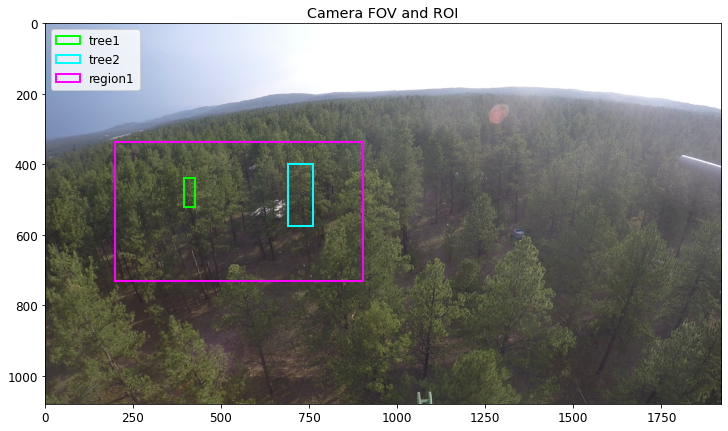

In [39]:
ax = plotting_utils.plot_frame(vid_path, title='Camera FOV and ROI', figsize=(14,7))
plotting_utils.plot_rois(ax, rois.values(), roicolors=['lime', 'cyan', 'fuchsia'])
ax.legend(rois.keys(), loc='upper left')

### 5.1.1 Define aggregation parameters

In [41]:
percentile_r1 = 30
masks_r1 = [{'name':f'Prominence, {percentile_r1}th percentile',
            'weight':'prominence',
            'kwargs':{'stat_reduc':'percentile', 'percentile':percentile_r1}},
           ]

### 5.1.2 Compute frequencies using VVSAnalyzer

In [43]:
roi = 'region1'

vvs_r1 = VVSAnalyzer.VVSAnalyzer(vid_path, rois[roi], out_prefix)
vib_vvs_r1, fps = vvs_r1.vid2vib(vid2vib_vvs_kwargs)
freq_vvs_r1, pxx_vvs_r1 = vvs_r1.compute_spectra(freqmin, freqmax, spectra_func, spectra_func_kwargs)

Reading video into array
902
Finished reading video into array
Computing pixel spectra
Finished computing spectra


In [44]:
# separete from above cell so can adjuster filtering as necessary without recomputing frequencies
agg_df_vvs_r1, pxx_avg_vvs_r1, pxx_avg_peak_idx_vvs_r1, dom_freq_r1, masked_r1, masked_avg_spectrums_r1, masked_avg_spectrums_peak_idxs_r1 = vvs_r1.aggregate(dom_freq_func, dom_freq_func_kwargs, masks_r1)
pixel_counts_r1, bins_r1 = aggregate_utils.hist_spectrum(masked_r1[0], freq_vvs_r1)
hist_peak_idx_r1, _, _ = spectra_utils.find_dominant_peak(pixel_counts_r1, criteria='magnitude')

### 5.1.3 Plot Results

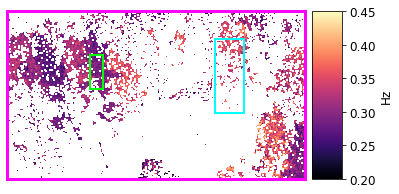

In [52]:
low_r1 = 0.2 # Hz
high_r1 = 0.45 # Hz

ax = plotting_utils.plot_image(masked_r1[0],
                               low=low_r1, 
                               high=high_r1, 
                               ax=None, 
                               cmap='magma', 
                               colorbar=True, 
                               colorbarlabel='Hz',
                               ticks=False,
                               edgecolor='fuchsia')

w293_roi = np.array(rois['tree1']) - [rois['region1'][0], rois['region1'][0], rois['region1'][2], rois['region1'][2]]
control460_roi = np.array(rois['tree2']) - [rois['region1'][0], rois['region1'][0], rois['region1'][2], rois['region1'][2]]

plotting_utils.plot_rois(ax, [w293_roi, control460_roi], roicolors=['lime', 'cyan'])

## 5.2 Create new figure

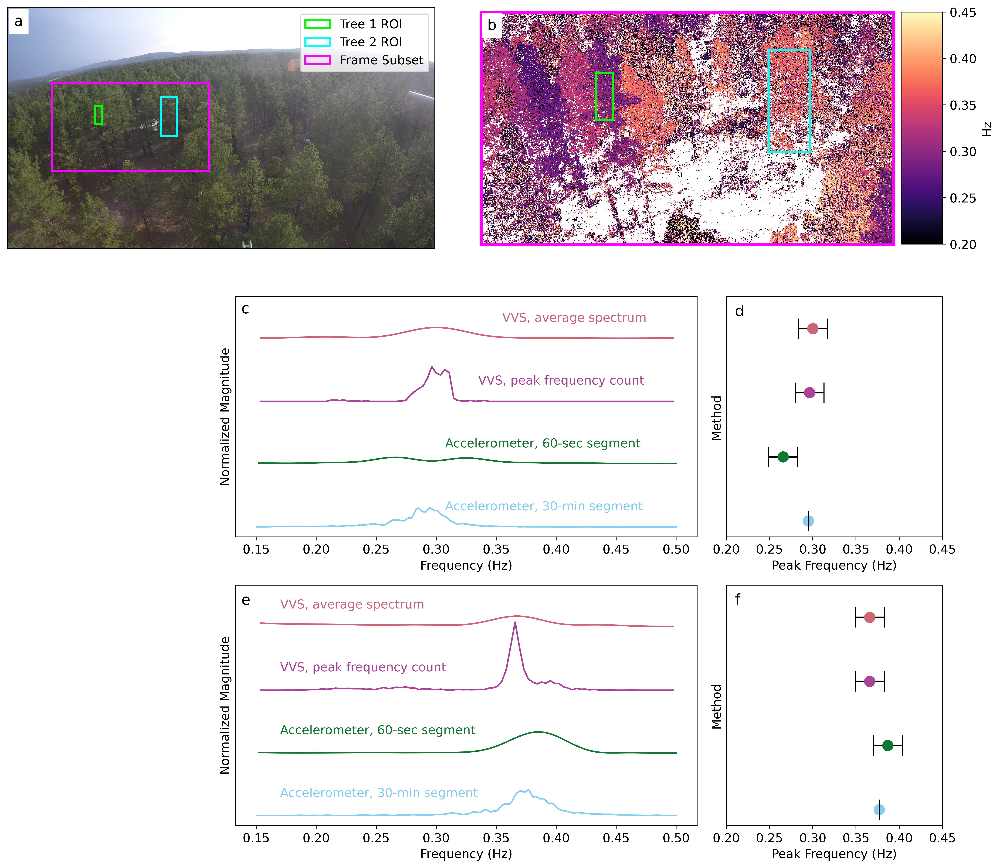

In [51]:
matplotlib.rcParams.update({'font.size': 12})

pattern = '''
AABB
.CCD
.EEF
'''

fig, ax = plt.subplot_mosaic(pattern, figsize=(14,12), dpi=500)

# Plot frame and ROI
plotting_utils.plot_frame(vid_path, ax=ax['A'], ticks=False)
plotting_utils.plot_rois(ax['A'], [rois['tree1'], rois['tree2'], rois['region1']], roicolors=['lime', 'cyan', 'fuchsia'])
ax['A'].annotate('a', (30,80), c='k', backgroundcolor='w', fontsize='large')
ax['A'].legend(['Tree 1 ROI', 'Tree 2 ROI', 'Frame Subset'])



# Plot Frequency heat map
plotting_utils.plot_image(masked_r1[0],
                          low=low_r1, 
                          high=high_r1, 
                          ax=ax['B'], 
                          cmap='magma', 
                          colorbar=True, 
                          colorbarlabel='Hz',
                          ticks=False,
                          edgecolor='fuchsia')

w293_roi = np.array(rois['tree1']) - [rois['region1'][0], rois['region1'][0], rois['region1'][2], rois['region1'][2]]
control460_roi = np.array(rois['tree2']) - [rois['region1'][0], rois['region1'][0], rois['region1'][2], rois['region1'][2]]

plotting_utils.plot_rois(ax['B'], [w293_roi, control460_roi], roicolors=['lime', 'cyan'])

ax['B'].annotate('b', (10,30), c='k', backgroundcolor='white', fontsize='large')

#*** Tree 1 ***

# Plot offset spectra for tree 1
bottom = 0 # where first signal starts
pad = 75 # space between each signal
label_hoffsets = [0.3075, 0.3075, 0.335, 0.355] # horizontal offsets of signal labels
label_voffset = 20 # vertical  offset of signal label
for i, s in enumerate(output_signals_t1):
    f = s['freq']
    df = f[1] - f[0]
    
    psd_normalized = spectra_utils.normalize(s['psd'], dx=df)
    
    ax['C'].plot(f, psd_normalized + bottom,label=s['label'], c=s['color'])
    ax['C'].annotate(s['label'], 
                     (label_hoffsets[i],bottom + label_voffset), 
                     c=s['label_color'], 
                     backgroundcolor='None', 
                     fontsize='medium')
    bottom = bottom + pad
ylim = ax['C'].get_ylim()
ax['C'].set_ylim(ylim[0], 1.1*ylim[1])  
ax['C'].set_ylabel('Normalized Magnitude')
ax['C'].set_xlabel('Frequency (Hz)')
ax['C'].set_yticks([])
ax['C'].annotate('c', (0.1375,255), c='k', backgroundcolor='None', fontsize='large')

# Plot corresponding peaks
for i, s in enumerate(output_signals_t1):
    peak = s['freq'][s['peak_idx']]
    ax['D'].errorbar(peak, i, xerr=s['frequency_resolution'] / 2, color='k', capsize=10)
    ax['D'].scatter(peak, i, color=s['color'], marker='.', s=400, zorder=2)
ax['D'].set_xlim(0.2, 0.45)
ax['D'].set_yticks([])
ax['D'].set_xlabel('Peak Frequency (Hz)')
ax['D'].set_ylabel('Method')
ax['D'].set_ylim(-0.25, 3.5)
ax['D'].annotate('d', (0.21,3.2), c='k', backgroundcolor='None', fontsize='large')

#*** Tree 2 ***

# Plot offset spectra for tree 2
bottom = 0 
pad = 50
label_hoffset = 0.17
label_voffset = 15
for s in output_signals_t2:
    f = s['freq']
    df = f[1] - f[0]
    
    psd_normalized = spectra_utils.normalize(s['psd'], dx=df)
    
    ax['E'].plot(f, psd_normalized + bottom,label=s['label'], c=s['color'])
    ax['E'].annotate(s['label'], 
                     (label_hoffset,bottom + label_voffset), 
                     c=s['label_color'], 
                     backgroundcolor='None', 
                     fontsize='medium')
    bottom = bottom + pad
ylim = ax['E'].get_ylim()
ax['E'].set_ylim(ylim[0], 1.1*ylim[1])  
ax['E'].set_ylabel('Normalized Magnitude')
ax['E'].set_xlabel('Frequency (Hz)')
ax['E'].set_yticks([])
ax['E'].annotate('e', (0.1375,168), c='k', backgroundcolor='None', fontsize='large')

# Plot corresponding peaks
for i, s in enumerate(output_signals_t2):
    peak = s['freq'][s['peak_idx']]
    ax['F'].errorbar(peak, i, xerr=s['frequency_resolution'] / 2, color='k', capsize=10)
    ax['F'].scatter(peak, i, color=s['color'], marker='.', s=400, zorder=2)
ax['F'].set_xlim(0.2, 0.45)
ax['F'].set_yticks([])
ax['F'].set_xlabel('Peak Frequency (Hz)')
ax['F'].set_ylabel('Method')
ax['F'].set_ylim(-0.25, 3.5)
ax['F'].annotate('f', (0.21,3.2), c='k', backgroundcolor='None', fontsize='large')


plt.tight_layout()